In [1]:
import numpy as np
import pandas as pd

from smartem.segmentation import segmenter, utils
from skimage import measure
from smartem.offline.train_mb_error_detector.NNtools import UNet

import h5py
import matplotlib.pyplot as plt
import torch
import numpy as np
# import pyvoi
# from smartem.offline.train_mb_error_detector.tools import VI
from smartem.offline.train_mb_error_detector import pyvoi
import pandas as pd
import seaborn as sns
import segmentation_models_pytorch as smp
from tqdm import tqdm
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

from smartem.segmentation.utils import watershed as watershed_inhouse


# Set Variables and Models

In [2]:
checkpoint_folder = "/storage2/projects/smartEM/HybridGT_Models"
checkpoint_path = f"{checkpoint_folder}/unet_48_1.18e-01.pth"
data_path = "/storage2/projects/smartEM/em-vis/smartem-256-hybridgt-test.hdf5"
device = torch.device("cuda:1")
UNET_model = UNet.UNet(1,2)

# Define segmentation processing for testing different segmentations

In [3]:
def get_segmentation_output(data_path, Iseg, ignore_mem = False, gt_segmenter="cc"):

    data_dwts = []
    data_hdt_vois = []
    data_gt_vois = []

    with h5py.File(data_path, "r") as f:
        for reg in tqdm(f.keys()):
            group = f[reg]

            dwts = [int(dwt) for dwt in list(group.keys())]
            dwts.sort()
            slowest_dwt = dwts[-1]

            mask = group[f"{slowest_dwt}/mask"][()]
            if gt_segmenter == "cc":
                gt_labels = measure.label(255 - mask)
            elif gt_segmenter == "watershed":
                gt_labels = watershed(255 - mask)

            if gt_labels.shape[0] % 32 != 0:
                gt_labels = gt_labels[:-(gt_labels.shape[0] % 32), :]
            if mask.shape[0] % 32 != 0:
                    mask = mask[:-(mask.shape[0] % 32), :]

            im = group[f"{slowest_dwt}/im"][()]
            hdt_labels = Iseg.get_labels(im)
            if ignore_mem:
                gt_labels = gt_labels[mask == 0]
                hdt_labels = hdt_labels[mask == 0]

            # all dwts
            for dwt in tqdm(group.keys()):
                im = group[f"{dwt}/im"][()]
                labels = Iseg.get_labels(im)

                if ignore_mem:
                    labels = labels[mask == 0]    
                            
                gt_labels = gt_labels.flatten()
                labels = labels.flatten()
                hdt_labels = hdt_labels.flatten()

                voi_gt,_,_ = pyvoi.VI(gt_labels,labels)
                voi_hdt,_,_ = pyvoi.VI(hdt_labels, labels)

                data_gt_vois.append(voi_gt.item())
                data_hdt_vois.append(voi_hdt.item())
                data_dwts.append(int(dwt))

    return data_dwts, data_hdt_vois, data_gt_vois
    

In [4]:
# Using Connected Compoenents as GT Segmentation 

print("--------CC with Membrane-----------")
Iseg_cc = segmenter.Segmenter(checkpoint_path, segmenter_function = measure.label, device=device)
Iseg_cc.set_model(model_class=UNET_model)

data_dwts_cc, data_hdt_vois_cc, data_gt_vois_cc = get_segmentation_output(data_path, Iseg_cc, ignore_mem=False)

print("--------CC without Membrane---------")
# Iseg_cc = segmenter.Segmenter(checkpoint_path, segmenter_function = measure.label, device=device)
# Iseg_cc.set_model(model_class=model)

data_dwts_cc_without_mem, data_hdt_vois_cc_without_mem, data_gt_vois_cc_without_mem = get_segmentation_output(data_path, Iseg_cc, ignore_mem=True)


print("--------Watershed with Membrane---------")
Iseg_watershed = segmenter.Segmenter(checkpoint_path, segmenter_function=watershed, device=device)
Iseg_watershed.set_model(model_class=UNET_model)

data_dwts_watershed, data_hdt_vois_watershed, data_gt_vois_watershed = get_segmentation_output(data_path, Iseg_watershed, ignore_mem=False)

print("--------Watershed without Membrane---------")
Iseg_watershed = segmenter.Segmenter(checkpoint_path, segmenter_function = watershed, device=device)
Iseg_watershed.set_model(model_class=UNET_model)

data_dwts_watershed_without_mem, data_hdt_vois_watershed_without_mem, data_gt_vois_watershed_without_mem = get_segmentation_output(data_path, Iseg_watershed, ignore_mem=True)

# data = {"Dwell Time (ns)": data_dwts, "Variation of Information from GT (nats)": data_gt_vois, "Variation of Information from 1200ns (nats)": data_hdt_vois}
# df = pd.DataFrame(data=data)

--------CC with Membrane-----------


100%|██████████| 18/18 [02:35<00:00,  8.65s/it]


--------CC without Membrane---------


100%|██████████| 18/18 [02:17<00:00,  7.63s/it]


--------Watershed with Membrane---------


100%|██████████| 18/18 [05:22<00:00, 17.94s/it]


--------Watershed without Membrane---------


100%|██████████| 18/18 [05:03<00:00, 16.88s/it]


# Compare the two segmentations using a box plot

252 252 252 252
1008


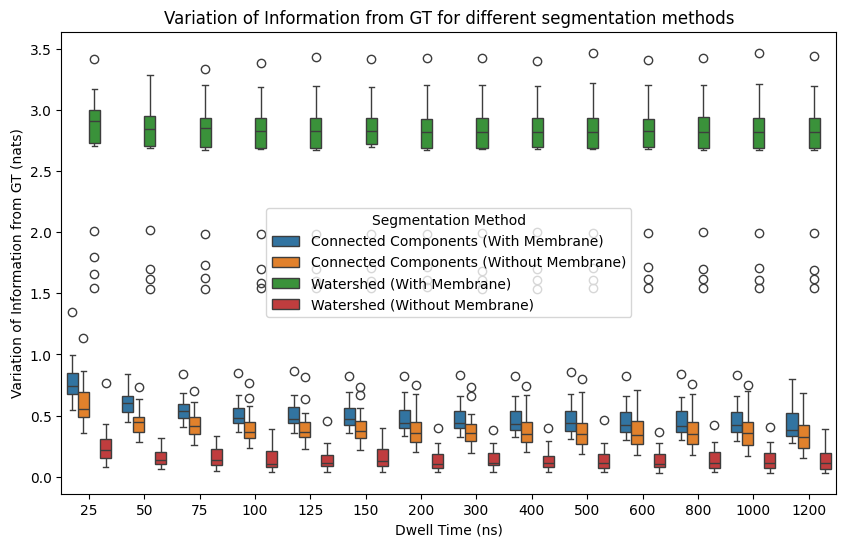

In [5]:
methods = ['Connected Components (With Membrane)'] * len(data_dwts_cc) + \
          ['Connected Components (Without Membrane)'] * len(data_dwts_cc_without_mem) + \
          ['Watershed (With Membrane)'] * len(data_dwts_watershed) + \
          ['Watershed (Without Membrane)'] * len(data_dwts_watershed_without_mem)

print(len(data_dwts_cc), len(data_dwts_cc_without_mem), len(data_dwts_watershed), len(data_dwts_watershed_without_mem))

print(len(methods))

data = {
    "Dwell Time (ns)": data_dwts_cc + data_dwts_cc_without_mem + data_dwts_watershed + data_dwts_watershed_without_mem, 
    "Variation of Information from GT (nats)": data_gt_vois_cc + data_gt_vois_cc_without_mem + data_gt_vois_watershed + data_gt_vois_watershed_without_mem, 
    "Segmentation Method": methods
}

df = pd.DataFrame(data=data)

plt.figure(figsize=(10, 6))
sns.boxplot(x="Dwell Time (ns)", y="Variation of Information from GT (nats)", hue="Segmentation Method", data=df)
plt.title("Variation of Information from GT for different segmentation methods") 
plt.show()

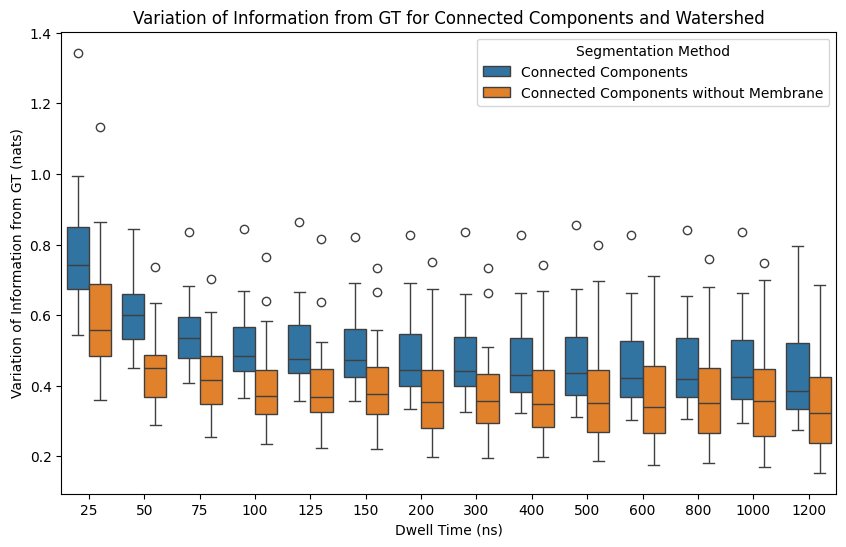

In [7]:
methods = ['Connected Components'] * len(data_dwts_cc) + ['Connected Components without Membrane'] * len(data_dwts_cc_without_mem)

data = {
    "Dwell Time (ns)": data_dwts_cc + data_dwts_cc_without_mem, 
    "Variation of Information from GT (nats)": data_gt_vois_cc + data_gt_vois_cc_without_mem, 
    "Segmentation Method": methods
}

df = pd.DataFrame(data=data)

plt.figure(figsize=(10, 6))
sns.boxplot(x="Dwell Time (ns)", y="Variation of Information from GT (nats)", hue="Segmentation Method", data=df)
plt.title("Variation of Information from GT for Connected Components and Watershed")
plt.show()

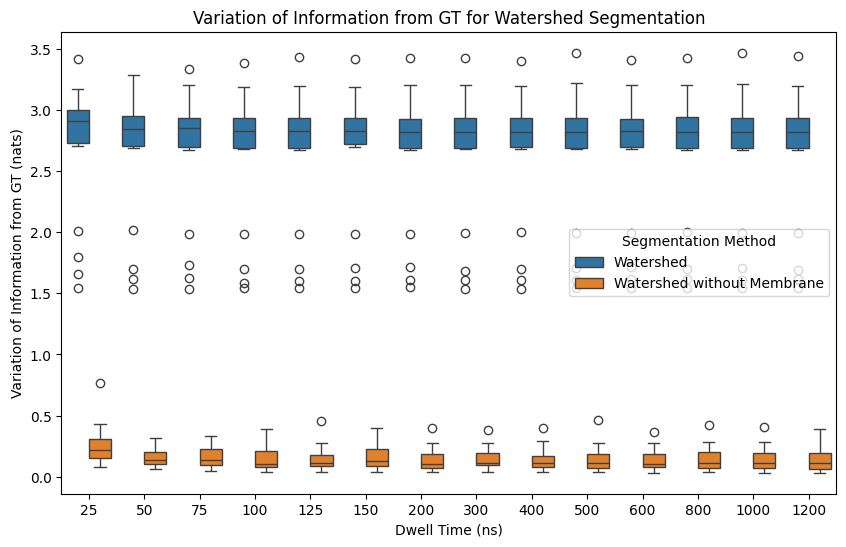

In [8]:
methods = ['Watershed'] * len(data_dwts_watershed) + ['Watershed without Membrane'] * len(data_dwts_watershed_without_mem)

data = {
    "Dwell Time (ns)": data_dwts_watershed + data_dwts_watershed_without_mem, 
    "Variation of Information from GT (nats)": data_gt_vois_watershed + data_gt_vois_watershed_without_mem, 
    "Segmentation Method": methods
}

df = pd.DataFrame(data=data)

plt.figure(figsize=(10, 6))
sns.boxplot(x="Dwell Time (ns)", y="Variation of Information from GT (nats)", hue="Segmentation Method", data=df)
plt.title("Variation of Information from GT for Watershed Segmentation")
plt.show()

# EXAMPLES

In [11]:
def get_images(data_path, Iseg, selected_entry=2, ignore_mem=False, debug=False):
    images = {}

    desired_dwts = [25, 100, 400, 1200]

    with h5py.File(data_path, "r") as f:
        reg = list(f.keys())[selected_entry]
        group = f[reg]

        dwts = [int(dwt) for dwt in list(group.keys())]
        dwts.sort()
        slowest_dwt = dwts[-1]
        
        mask = group[f"{slowest_dwt}/mask"][()]

        gt_labels = measure.label(255 - mask)
        if gt_labels.shape[0] % 32 != 0:
            gt_labels = gt_labels[:-(gt_labels.shape[0] % 32), :]
        
        if ignore_mem:
            if mask.shape[0] % 32 != 0:
                mask = mask[:-(mask.shape[0] % 32), :]
            if debug:
                print("MASK SHAPE", mask.shape)
                print(np.unique(mask, return_counts=True))

            # gt_labels = gt_labels * (mask == 0)
            gt_labels_for_VI = gt_labels[mask == 0]
            gt_labels = gt_labels * (mask == 0)
            # gt_labels = gt_labels * (mask == 0)
        else:
            gt_labels_for_VI = gt_labels
            # gt_labels = gt_labels[mask != 0]
        gt_labels_shuffled = utils.shuffle_labels(gt_labels)
        gt_labels_masked = np.ma.masked_where(gt_labels_shuffled == 0, gt_labels_shuffled)

        for dwt in desired_dwts:
            # print(dwt)
            im = group[f"{dwt}/im"][()]

            mask_low_res, mb_probs = Iseg.get_membranes(im, get_probs=True)
            labels = Iseg.get_labels(im)

            if ignore_mem:
                labels_for_VI = labels[mask == 0]
                labels = labels * (mask == 0)
            else:
                labels_for_VI = labels

            labels_shuffled = utils.shuffle_labels(labels)
            labels_masked = np.ma.masked_where(labels_shuffled == 0, labels_shuffled)
            
            voi,_,_ = pyvoi.VI(gt_labels_for_VI.flatten(), labels_for_VI.flatten())
            title_stem = f"{dwt}ns_VOI_{voi.item():.2f}"

            images[title_stem + "_image"] = im
            images[title_stem + "_label"] = labels_masked
            images[title_stem + "_pred"] = mb_probs[0][1]
            
    images["ground_truth_image"] = im
    images["ground_truth_label"] = gt_labels_masked
    images["ground_truth_pred"] = mask
    images["high_dwell_time_image"] = im
    return images


## Connected Components Output

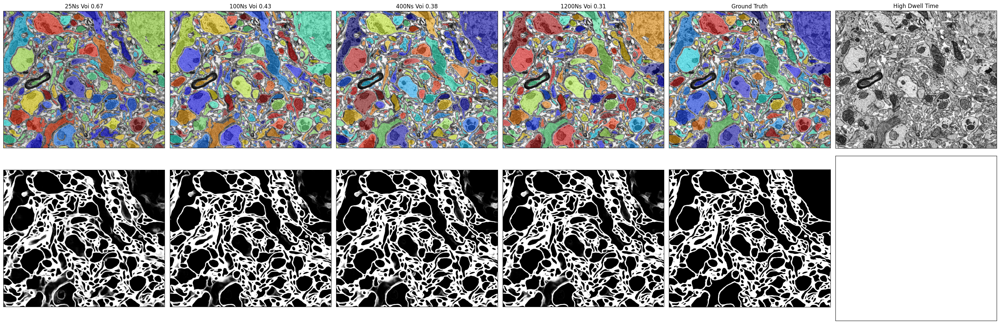

In [12]:
result_images_cc = get_images(data_path, Iseg_cc)
utils.visualize(**result_images_cc)

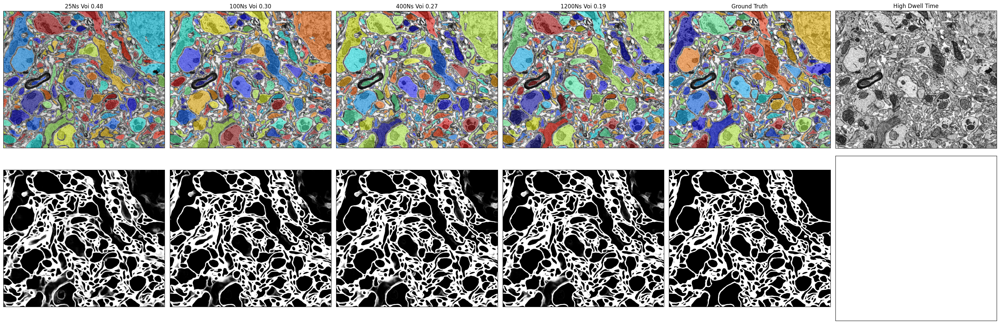

In [13]:
result_images_cc_without_mem = get_images(data_path, Iseg_cc, ignore_mem=True)
utils.visualize(**result_images_cc_without_mem)

## Watershed Output

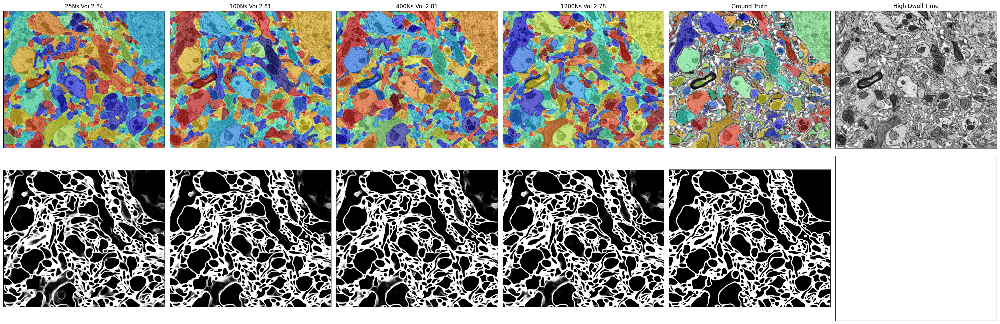

In [14]:
result_images_watershed = get_images(data_path, Iseg_watershed, ignore_mem=False)
utils.visualize(**result_images_watershed)

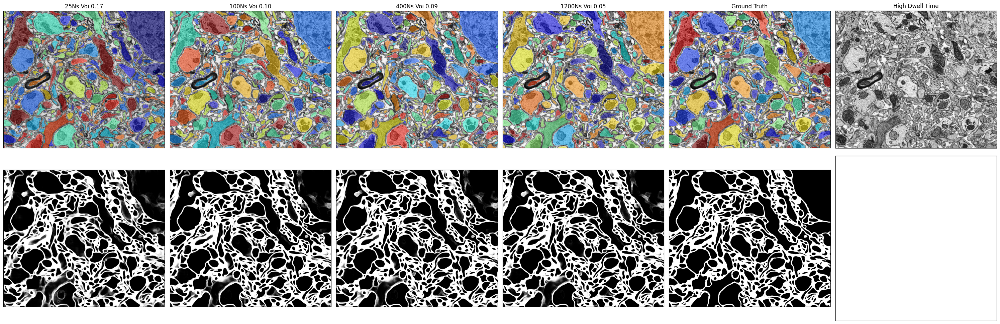

In [15]:
result_images_watershed_without_mem = get_images(data_path, Iseg_watershed, ignore_mem=True)
utils.visualize(**result_images_watershed_without_mem)